In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image
# from google.colab import files
import requests

- Para realizar este experimento, comenzaremos definiendo las funciones que conformarán todas las transformaciones a probar. De esta manera será mucho más sencillo ir probando combinaciones para obtener una buena pipeline que mejore estas imágenes con baja visibilidad.
- Imagenes que tenemos: 1013, 1036, 1077, 1090 (https://www.kaggle.com/datasets/soumikrakshit/dark-face-dataset)

Se comenzará diseñando todas las transformaciones de manera independiente

In [56]:
img_1013 = cv2.imread('../../data/img/1013.png')
img_1036 = cv2.imread('../../data/img/1036.png')
img_1077 = cv2.imread('../../data/img/1077.png')
img_1090 = cv2.imread('../../data/img/1090.png')
img_lenna = cv2.imread('../../data/img/lenna.png')
img_bananos = cv2.imread('../../data/img/bananos.png')

In [57]:
# CONVERTIRLAS A RGB

img_1013 = cv2.cvtColor(img_1013, cv2.COLOR_BGR2RGB)
img_1036 = cv2.cvtColor(img_1036, cv2.COLOR_BGR2RGB)
img_1077 = cv2.cvtColor(img_1077, cv2.COLOR_BGR2RGB)
img_1090 = cv2.cvtColor(img_1090, cv2.COLOR_BGR2RGB)
img_lenna = cv2.cvtColor(img_lenna, cv2.COLOR_BGR2RGB)
img_bananos = cv2.cvtColor(img_bananos, cv2.COLOR_BGR2RGB)

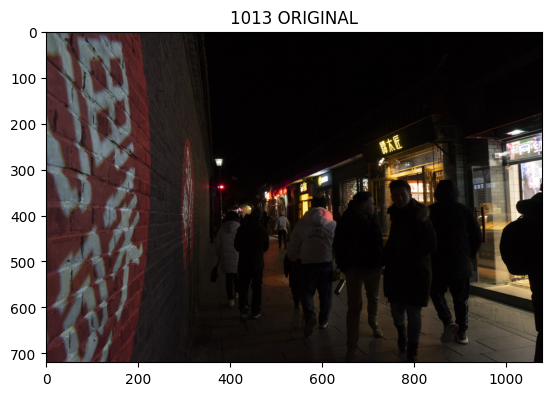

In [45]:
plt.title('1013 ORIGINAL')
plt.imshow(img_1013)

In [369]:
def normalizar(imagen):
    return cv2.normalize(imagen, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

In [ ]:
# 1. ESCALADO NEGATIVO

def imagen_negativa(imagen):
    return np.max(imagen) - imagen

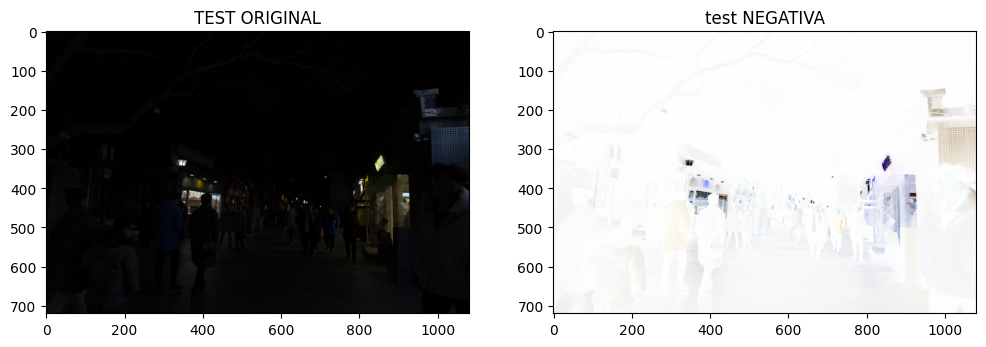

In [166]:
# TEST ESCALADO NEGATIVO

img = img_1077

test_negativa = imagen_negativa(img)
test_original = img

plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
plt.title('TEST ORIGINAL')
plt.imshow(test_original)
plt.subplot(1, 2, 2)
plt.title('test NEGATIVA')
plt.imshow(test_negativa, cmap='gray')

plt.show()

In [387]:
# ESCALADO LOGARÍTMICO

def transf_log(imagen):
    gamma = np.log(1 + 255)
    img_norm = imagen.astype(np.float32) + 1
    c_log = 255 / gamma
    img_log = c_log * np.log(1 + img_norm)
    img_log = np.uint64(np.clip(img_log, 0, 255))
    return img_log

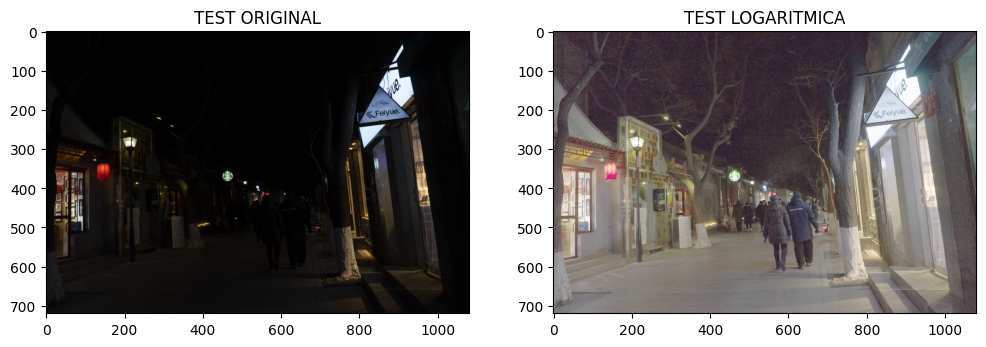

In [388]:
# TEST ESCALADO LOGARITMICO

img = img_1036

test_logaritmica = transf_log(img)
test_original = img

plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
plt.title('TEST ORIGINAL')
plt.imshow(test_original)
plt.subplot(1, 2, 2)
plt.title('TEST LOGARITMICA')
plt.imshow(test_logaritmica, cmap='gray')

plt.show()

In [125]:
# 3. TRANSOFORMACION - POTENCIA N

def potencia_n(imagen, gamma):
    norm_img = imagen.astype(np.float32) / 255.0
    c = 255 # tambien se puede jugar con este valor
    img_gamma = c * np.power(norm_img, gamma)
    return img_gamma

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


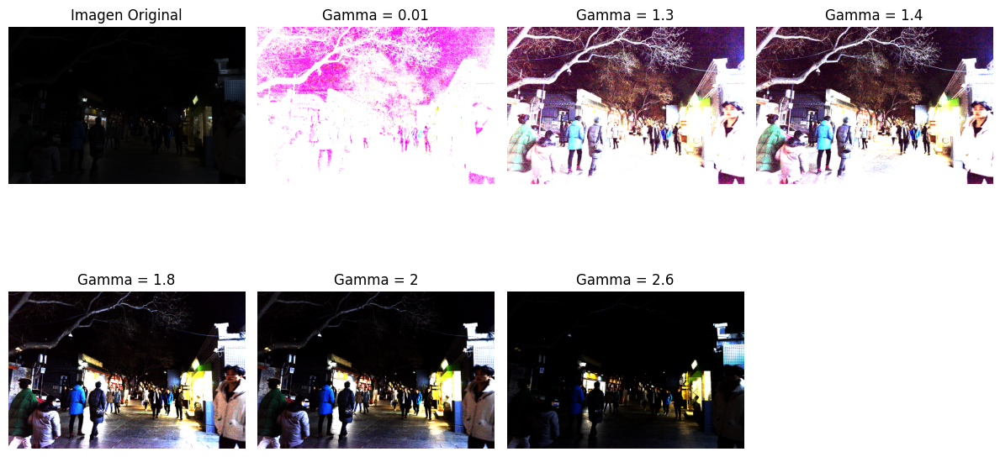

In [308]:
# TEST TRANSFORMACIONES GAMMA

img = img_1077
gamma_values = [0.01, 1.3, 1.4, 1.8, 2, 2.6]

plt.figure(figsize=(12, 7))

plt.subplot(2, 4, 1)
plt.title("Imagen Original")
plt.imshow(img)
plt.axis('off')

for i, gamma in enumerate(gamma_values, start=2):
    img_gamma = potencia_n(img, gamma)

    plt.subplot(2, 4, i)
    plt.title(f"Gamma = {gamma}")
    plt.imshow(img_gamma)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [136]:
# 4. ECUALIZADO HISTOGRAMA

def ecualizado(imagen):
    # ES NECESARIO ECUALIZAR CADA CANAL DE MANERA INDEPENDIENTE Y LUEGO UNIRLOS DE NUEVO
    r, g, b = cv2.split(imagen)
    
    r_eq = cv2.equalizeHist(r)
    g_eq = cv2.equalizeHist(g)
    b_eq = cv2.equalizeHist(b)
    
    equalized_image = cv2.merge([r_eq, g_eq, b_eq])
    
    return equalized_image

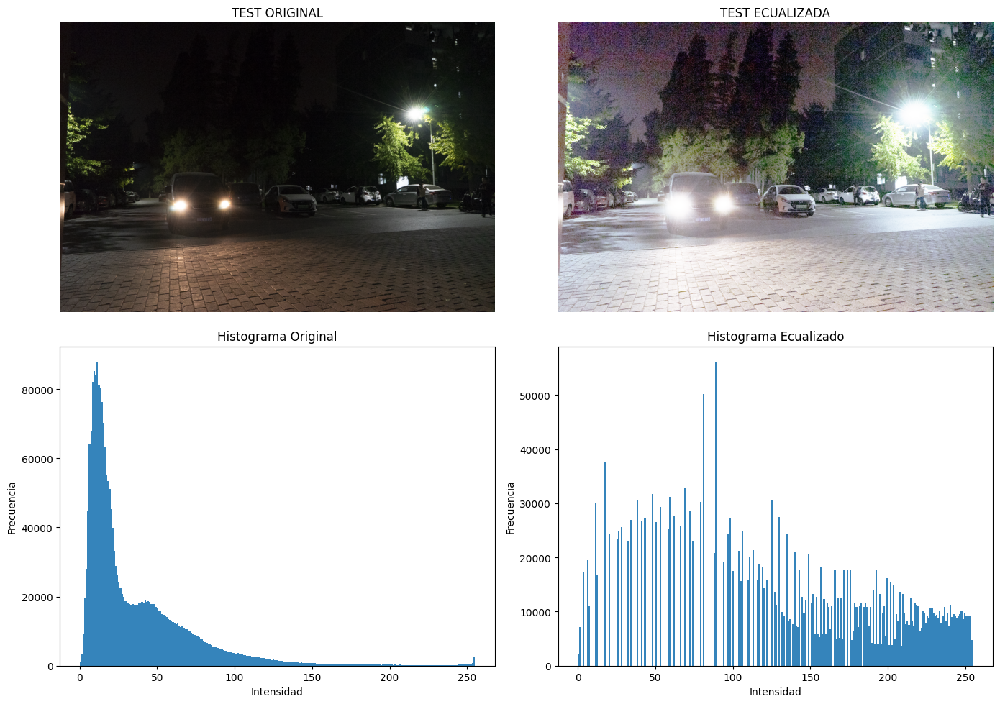

In [141]:
# TEST ECUALIZADO

img = img_1090
equalized_image = ecualizado(img)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.title("TEST ORIGINAL")
plt.imshow(img)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title("TEST ECUALIZADA")
plt.imshow(equalized_image)
plt.axis('off')

vector_g = img.flatten()
plt.subplot(2, 2, 3)
plt.hist(vector_g, bins=256, alpha=0.9)
plt.title("Histograma Original")
plt.xlabel("Intensidad")
plt.ylabel("Frecuencia")

vector_e = equalized_image.flatten()
plt.subplot(2, 2, 4)
plt.hist(vector_e, bins=256, alpha=0.9)
plt.title("Histograma Ecualizado")
plt.xlabel("Intensidad")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()

In [142]:
# 5. ECUALIZADO HISTOGRAMA - CLAHE

def clahe_ecualizado(imagen, clipLimit=2.0, tileGridSize=(8, 8)):
    clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    r, g, b = cv2.split(imagen)
    r_clahe = clahe.apply(r)
    g_clahe = clahe.apply(g)
    b_clahe = clahe.apply(b)
    equalized_image = cv2.merge([r_clahe, g_clahe, b_clahe])
    return equalized_image

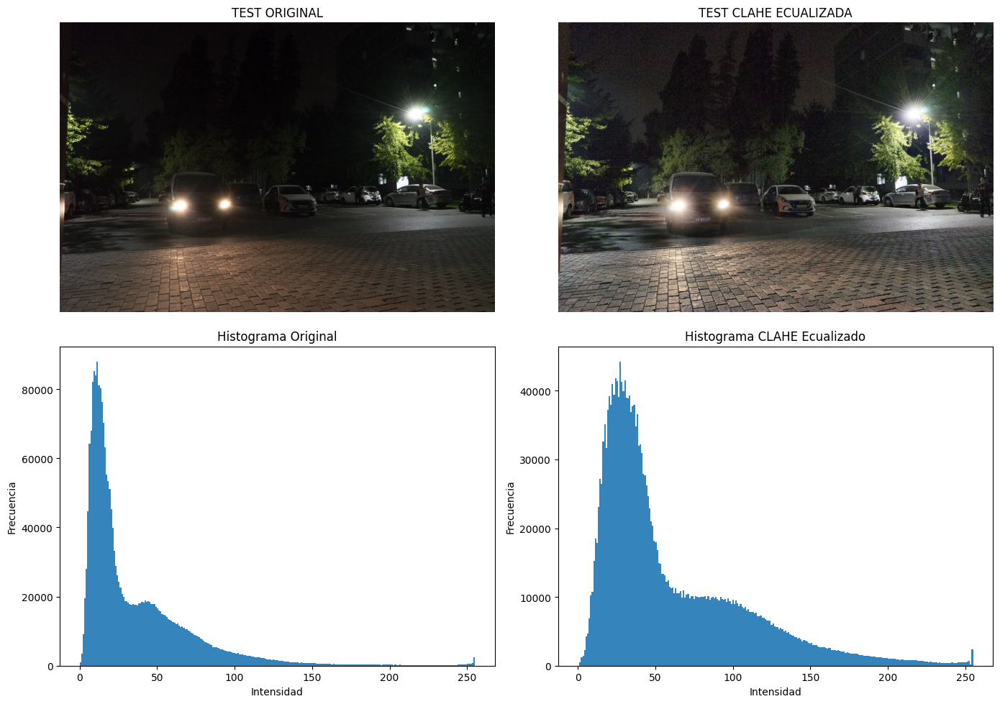

In [145]:
# TEST ECUALIZADO - CLAHE

img = img_1090
equalized_image_clahe = clahe_ecualizado(img)

plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.title("TEST ORIGINAL")
plt.imshow(img)
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title("TEST CLAHE ECUALIZADA")
plt.imshow(equalized_image_clahe)
plt.axis('off')

vector_g = img.flatten()
plt.subplot(2, 2, 3)
plt.hist(vector_g, bins=256, alpha=0.9)
plt.title("Histograma Original")
plt.xlabel("Intensidad")
plt.ylabel("Frecuencia")

vector_e = equalized_image_clahe.flatten()
plt.subplot(2, 2, 4)
plt.hist(vector_e, bins=256, alpha=0.9)
plt.title("Histograma CLAHE Ecualizado")
plt.xlabel("Intensidad")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()

In [148]:
# 6. MULTIPLICACIÓN - RECORTE

def multiplicacion(imagen, factor):
    image_clipped = np.clip(imagen * factor, 0, 255).astype(np.uint8)
    # clipped_rgb = cv2.cvtColor(image_clipped, cv2.COLOR_BGR2RGB)
    return image_clipped

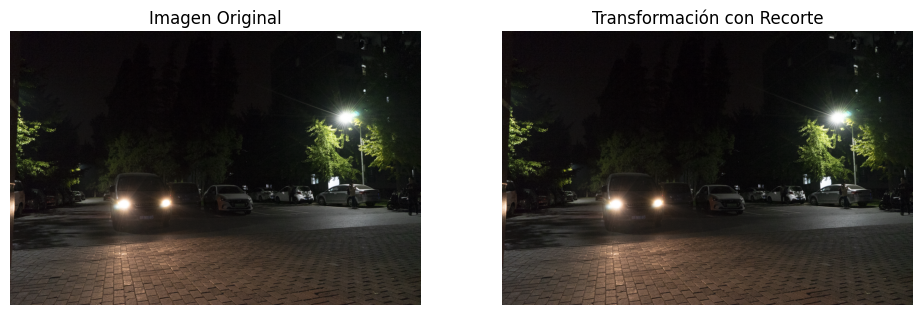

In [158]:
img = img_1090
factor = 2.9 # A MAYOR FACTOR, MAYOR BRILLO

img_multiplicacion = multiplicacion(img, factor)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Imagen Original")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Transformación con Recorte")
plt.imshow(img_multiplicacion)
plt.axis("off");

In [224]:
# 7. MULTIPLICACIÓN - NORMALIZACIÓN

def normalizacion(imagen, factor):
        normalized = ((imagen * factor - np.min(imagen * factor)) / (np.max(imagen * factor) - np.min(imagen * factor)) * 255).astype(np.uint8)
        # normalized_rgb = cv2.cvtColor(normalized, cv2.COLOR_BGR2RGB)
        return normalized

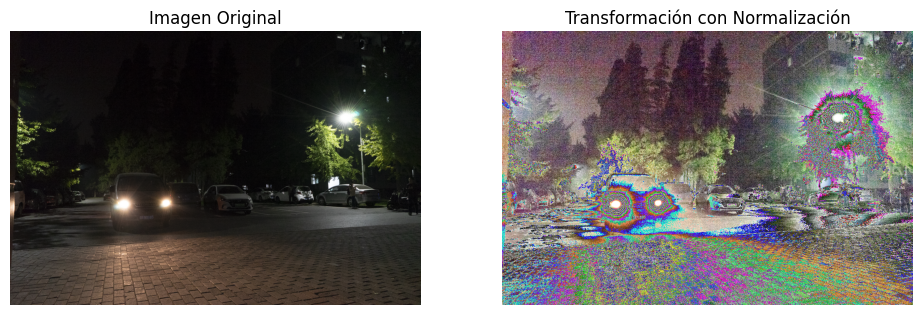

In [225]:
img = img_1090
factor = 8 # A MAYOR FACTOR, MAYOR BRILLO

normalizacion = normalizacion(img, factor)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("Imagen Original")
plt.imshow(img)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Transformación con Normalización")
plt.imshow(normalizacion)
plt.axis("off");

Ahora que se han implementado todas las funciones de las técnicas de transformación que se van a realizar, se procederá a aplicarlas a las diferentes imágenes, una por una.
El objetivo será diseñar la mejor pipeline posible para cada una de las imágenes

1. IMG_1013

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

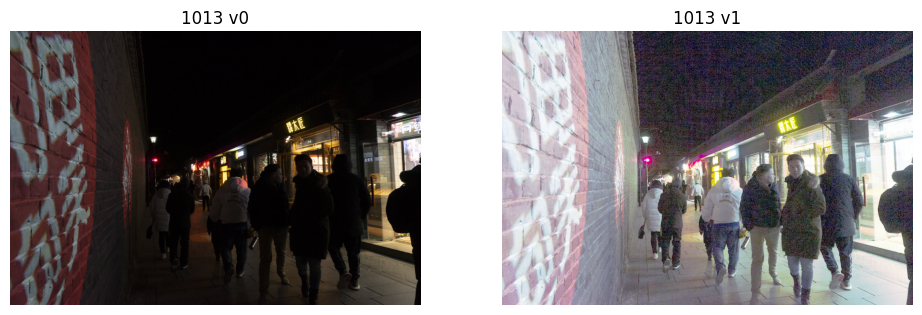

In [242]:
img_1013_1 = ecualizado(img_1013)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1013 v0")
plt.imshow(img_1013)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1013 v1")
plt.imshow(img_1013_1)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

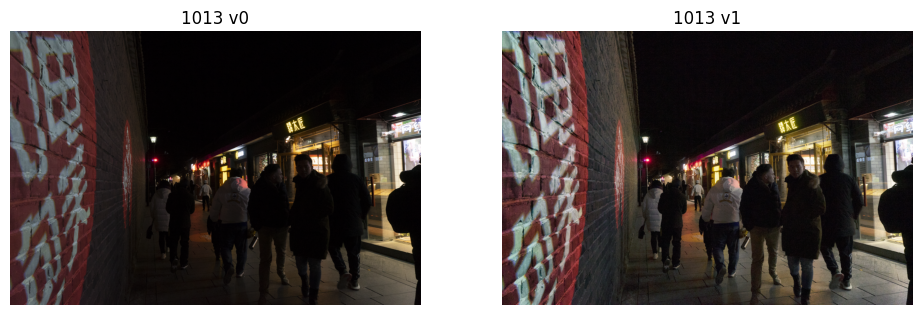

In [251]:
img_1013_1 = clahe_ecualizado(img_1013)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1013 v0")
plt.imshow(img_1013)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1013 v1")
plt.imshow(img_1013_1)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

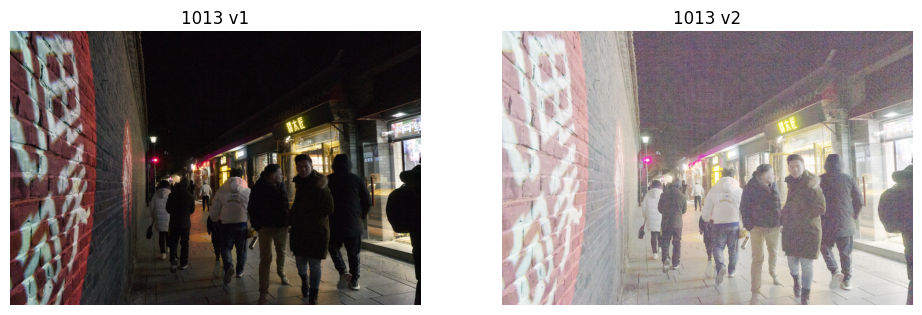

In [252]:
img_1013_2 = transf_log(img_1013_1)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1013 v1")
plt.imshow(img_1013_1)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1013 v2")
plt.imshow(img_1013_2)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

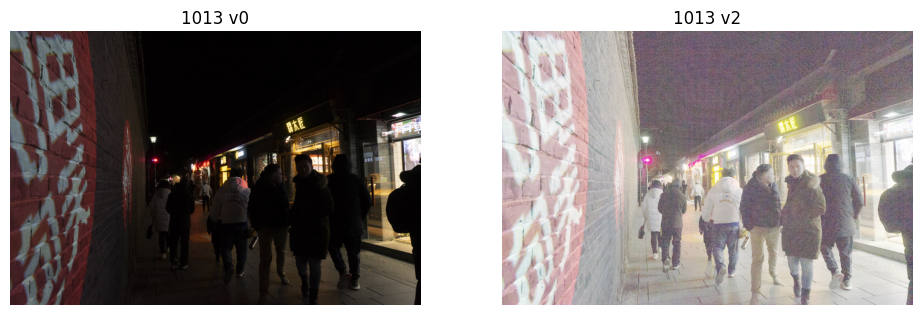

In [253]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1013 v0")
plt.imshow(img_1013)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1013 v2")
plt.imshow(img_1013_2)
plt.axis("off")

# IMG 1036

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

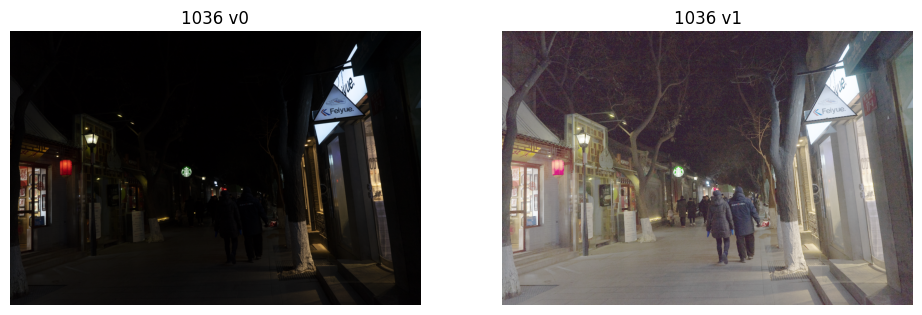

In [290]:
img_1036_1 = transf_log(img_1036)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1036 v0")
plt.imshow(img_1036)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1036 v1")
plt.imshow(img_1036_1)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

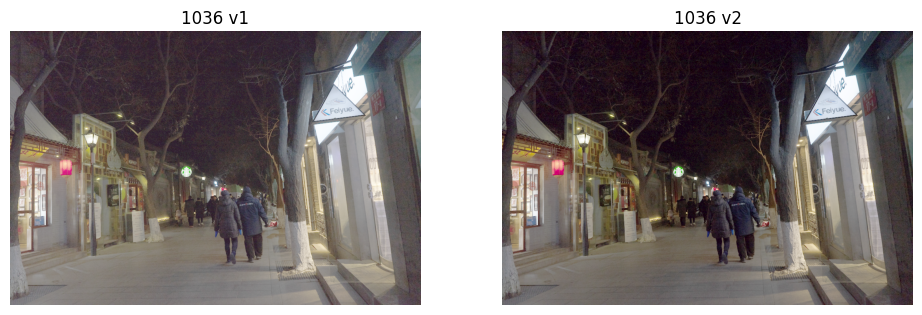

In [297]:
img_1036_2 = multiplicacion(img_1036_1, 2.5)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1036 v1")
plt.imshow(img_1036_1)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1036 v2")
plt.imshow(img_1036_2)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

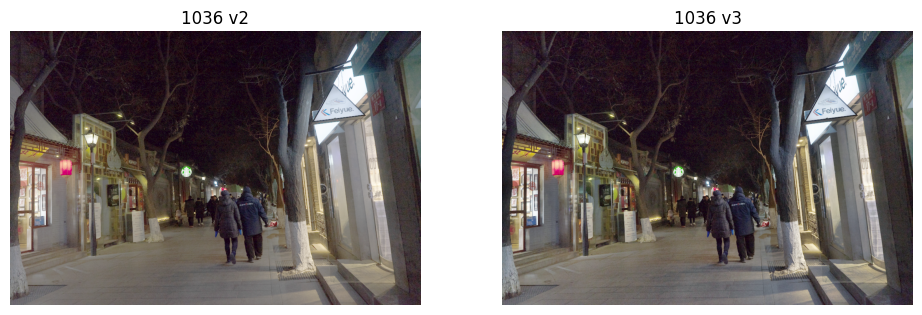

In [301]:
img_1036_3 = clahe_ecualizado(img_1036_2)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1036 v2")
plt.imshow(img_1036_2)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1036 v3")
plt.imshow(img_1036_3)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

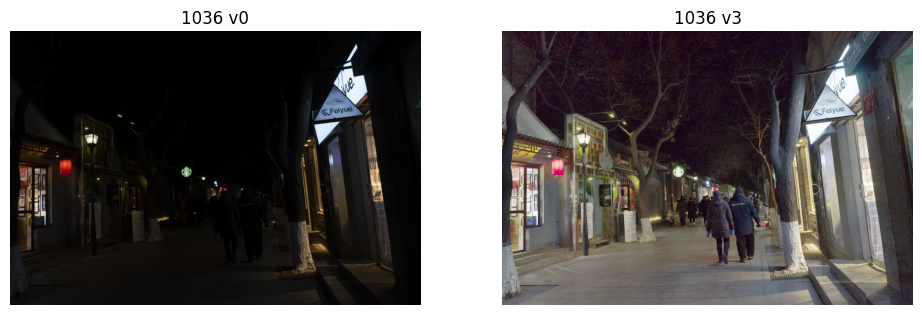

In [302]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1036 v0")
plt.imshow(img_1036)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1036 v3")
plt.imshow(img_1036_3)
plt.axis("off")

# IMG 1077

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

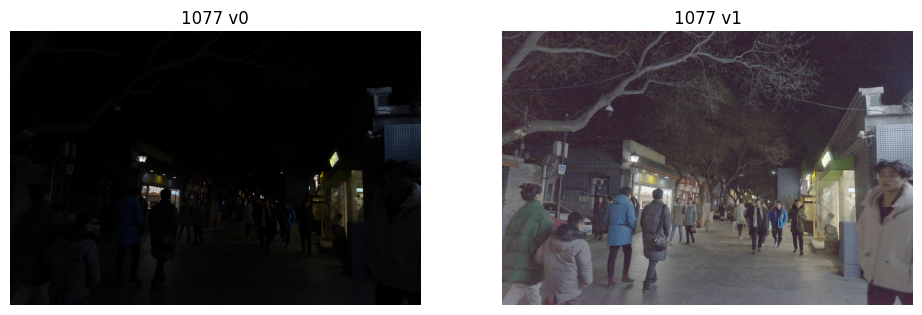

In [390]:
img_1077_1 = transf_log(img_1077)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1077 v0")
plt.imshow(img_1077)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1077 v1")
plt.imshow(img_1077_1)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

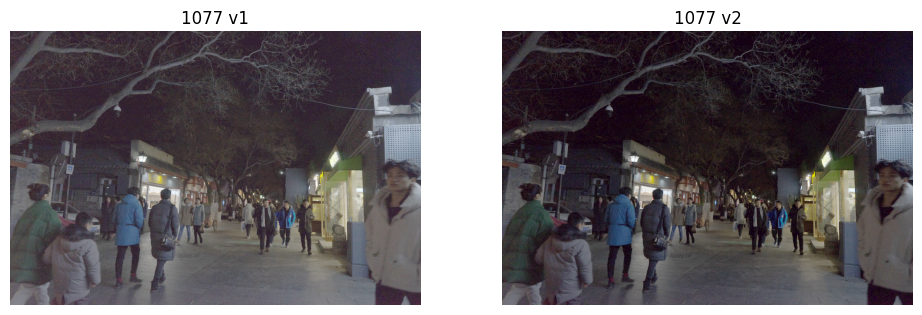

In [401]:
img_1077_2 = multiplicacion(img_1077_1, 2)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1077 v1")
plt.imshow(img_1077_1)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1077 v2")
plt.imshow(img_1077_2)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

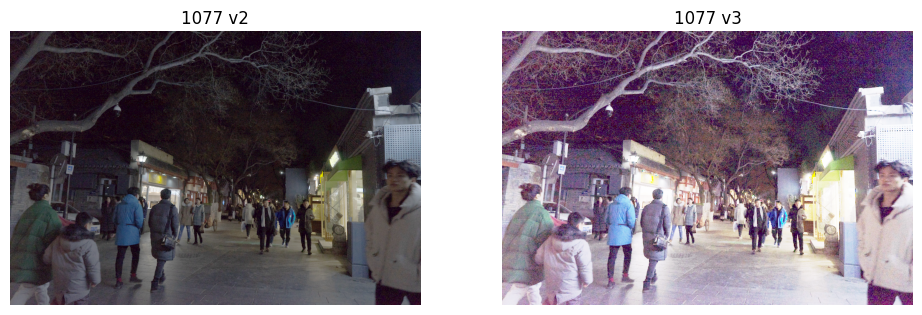

In [406]:
img_1077_3 = ecualizado(img_1077_2)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1077 v2")
plt.imshow(img_1077_2)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1077 v3")
plt.imshow(img_1077_3)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

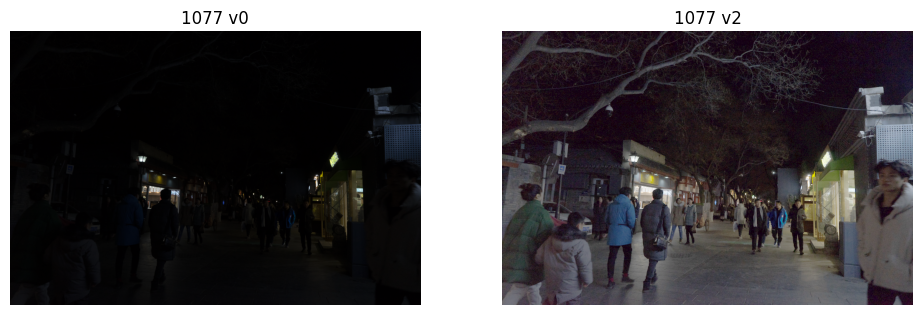

In [407]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1077 v0")
plt.imshow(img_1077)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1077 v2")
plt.imshow(img_1077_2)
plt.axis("off")

# IMG 1090

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

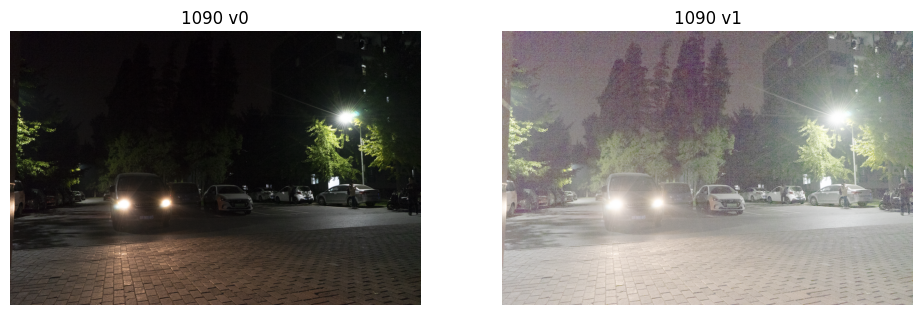

In [426]:
img_1090_1 = transf_log(img_1090)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1090 v0")
plt.imshow(img_1090)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1090 v1")
plt.imshow(img_1090_1)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

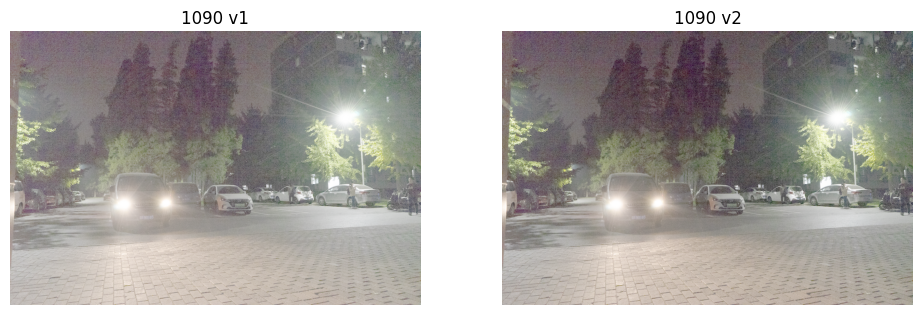

In [427]:
img_1090_2 = multiplicacion(img_1090_1, 2)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1090 v1")
plt.imshow(img_1090_1)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1090 v2")
plt.imshow(img_1090_2)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

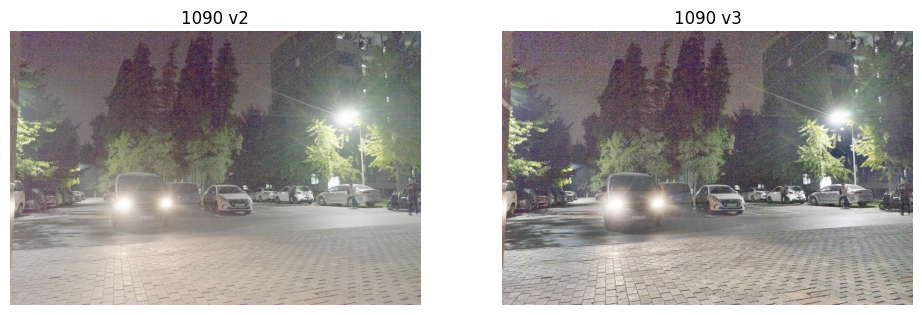

In [428]:
img_1090_3 = clahe_ecualizado(img_1090_2)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1090 v2")
plt.imshow(img_1090_2)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1090 v3")
plt.imshow(img_1090_3)
plt.axis("off")

(np.float64(-0.5), np.float64(1079.5), np.float64(719.5), np.float64(-0.5))

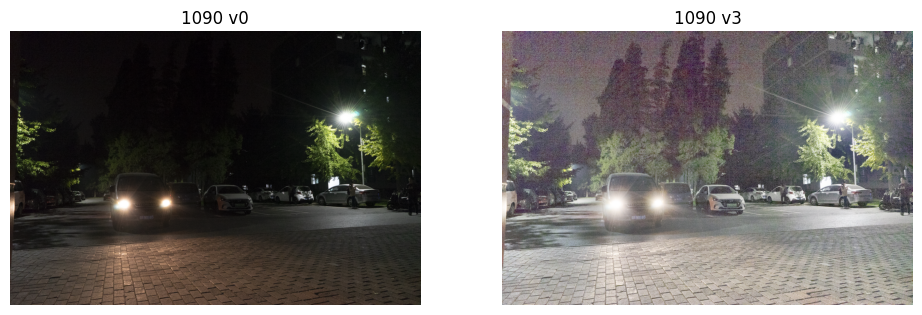

In [429]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.title("1090 v0")
plt.imshow(img_1090)
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("1090 v3")
plt.imshow(img_1090_3)
plt.axis("off")